In [1]:
from pathlib import Path

import plotly.express as px
import plotly.graph_objects as go
import polars as pl

from plotly.subplots import make_subplots
from result import Result

from raft.services.renav import read_cameras, clean_camera_dataframe
from raft.utils.log import logger

In [2]:
CAMERA_PATH: Path = Path(
    "/home/martin/data/acfr_revisits_processed/acfr_renav_cameras/qd61g27j_20100421_022145_cameras.csv"
)

In [3]:
read_result: Result[pl.DataFrame, str] = read_cameras(CAMERA_PATH)

cameras: pl.DataFrame = read_result.unwrap()
cameras: pl.DataFrame = clean_camera_dataframe(cameras)

figs: dict = dict()

logger.info(cameras.columns)
logger.info(cameras.head())

2024-05-28 14:08:47.903 | INFO     | __main__:<module>:8 - ['stereo_left_label', 'stereo_right_label', 'timestamp', 'latitude', 'longitude', 'height', 'depth', 'roll', 'pitch', 'heading', 'altitude', 'bounding_radius', 'stereo_left_image_name', 'stereo_right_image_name']
2024-05-28 14:08:47.904 | INFO     | __main__:<module>:9 - shape: (5, 14)
┌───────────┬───────────┬───────────┬───────────┬───┬──────────┬───────────┬───────────┬───────────┐
│ stereo_le ┆ stereo_ri ┆ timestamp ┆ latitude  ┆ … ┆ altitude ┆ bounding_ ┆ stereo_le ┆ stereo_ri │
│ ft_label  ┆ ght_label ┆ ---       ┆ ---       ┆   ┆ ---      ┆ radius    ┆ ft_image_ ┆ ght_image │
│ ---       ┆ ---       ┆ f64       ┆ f64       ┆   ┆ f32      ┆ ---       ┆ name      ┆ _name     │
│ str       ┆ str       ┆           ┆           ┆   ┆          ┆ f32       ┆ ---       ┆ ---       │
│           ┆           ┆           ┆           ┆   ┆          ┆           ┆ str       ┆ str       │
╞═══════════╪═══════════╪═══════════╪═══════════

### Plot timeseries of roll, pitch, and heading

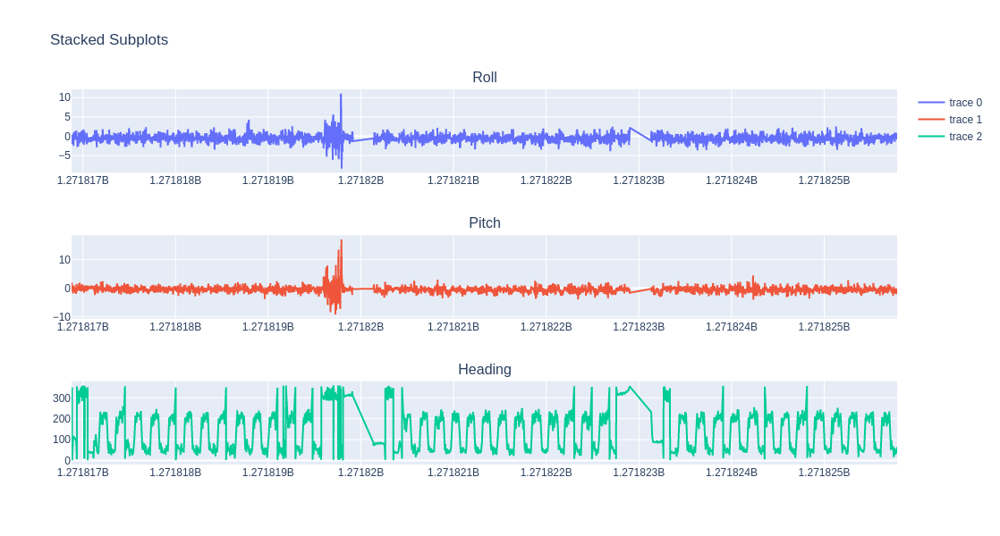

In [4]:
figs["attitude"] = make_subplots(
    rows=3, cols=1, subplot_titles=("Roll", "Pitch", "Heading")
)

figs["attitude"].append_trace(
    go.Scatter(
        x=cameras["timestamp"],
        y=cameras["pitch"],
    ),
    row=1,
    col=1,
)
figs["attitude"].append_trace(
    go.Scatter(
        x=cameras["timestamp"],
        y=cameras["roll"],
    ),
    row=2,
    col=1,
)
figs["attitude"].append_trace(
    go.Scatter(
        x=cameras["timestamp"],
        y=cameras["heading"],
    ),
    row=3,
    col=1,
)

figs["attitude"].update_layout(height=600, width=1000, title_text="Stacked Subplots")
figs["attitude"].show()

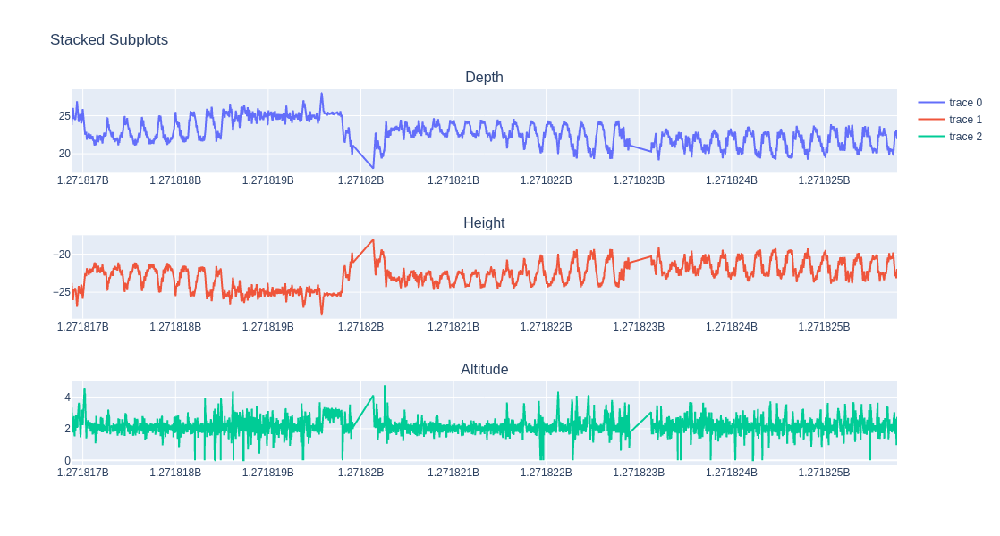

In [5]:
figs["vertical"] = make_subplots(
    rows=3, cols=1, subplot_titles=("Depth", "Height", "Altitude")
)

figs["vertical"].append_trace(
    go.Scatter(
        x=cameras["timestamp"],
        y=cameras["depth"],
    ),
    row=1,
    col=1,
)
figs["vertical"].append_trace(
    go.Scatter(
        x=cameras["timestamp"],
        y=cameras["height"],
    ),
    row=2,
    col=1,
)
figs["vertical"].append_trace(
    go.Scatter(
        x=cameras["timestamp"],
        y=cameras["altitude"],
    ),
    row=3,
    col=1,
)

figs["vertical"].update_layout(height=600, width=1000, title_text="Stacked Subplots")
figs["vertical"].show()

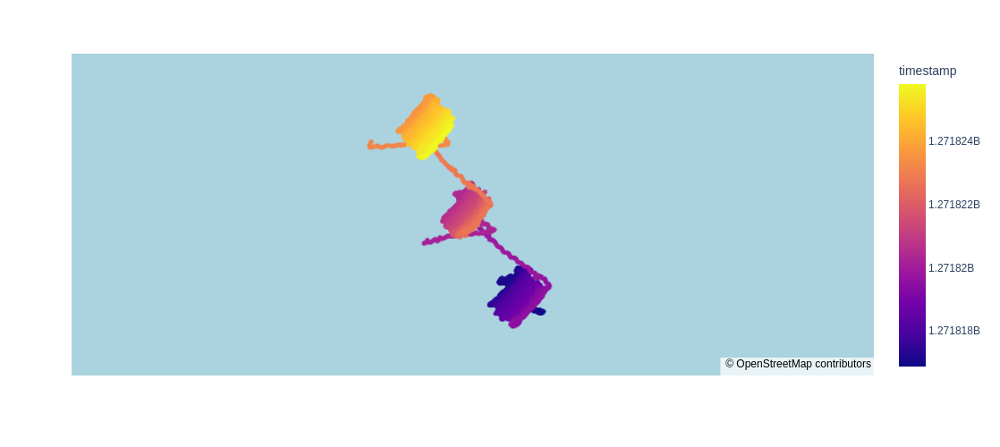

In [6]:
figs["locations"] = px.scatter_mapbox(
    cameras,
    lat="latitude",
    lon="longitude",
    color="timestamp",
    size_max=15,
    zoom=17,
    height=600,
    hover_data={"heading", "stereo_left_label", "depth"},
)

figs["locations"].update_layout(height=500, width=1000, mapbox_style="open-street-map")
figs["locations"].show()